In [1]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from torch.utils.data import DataLoader

from decifer import (
    DeciferDataset,
    HDF5Dataset,
    Tokenizer,
)

In [2]:
dataset = DeciferDataset('../data/crystallm/test/serialized/train.h5', ['cif_string', 'cif_tokenized', 'species', 'spacegroup', 'xrd_cont.iq'])
dataloader = DataLoader(dataset, batch_size=1)

R-3m


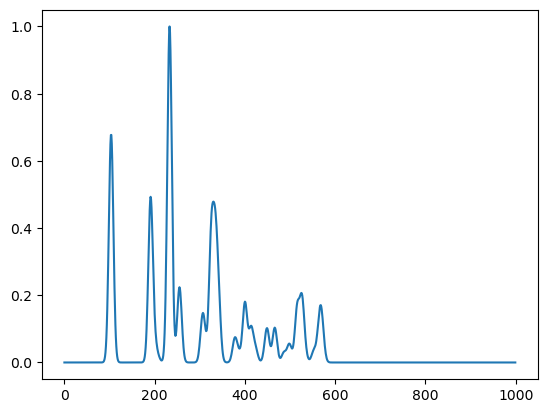

In [3]:
for batch in dataloader:
    sample = batch
#     print(sample[0][0])
    print(sample[3][0])
    plt.plot(sample[-1][0])
    break

In [1]:
import matplotlib.pyplot as plt
import matplotlib.patheffects as PathEffects
from torch.utils.data import DataLoader

from decifer import (
    HDF5Dataset,
    Tokenizer,
)

# Example usage:
tok = Tokenizer()
block_size = 20000  # Transformer context length
dataset = HDF5Dataset('../data/crystallm/5k/hdf5/train_dataset.h5', 
                      ['name', 'xrd_cont_x', 'xrd_cont_y', 'xrd_discrete_x', 'xrd_discrete_y', 'xrd_tokenized', 'cif_tokenized', 'cif_content'], block_size)
dataloader = DataLoader(dataset, batch_size=32, shuffle=True)

Processing datasets:   0%|          | 0/8 [00:00<?, ?it/s]

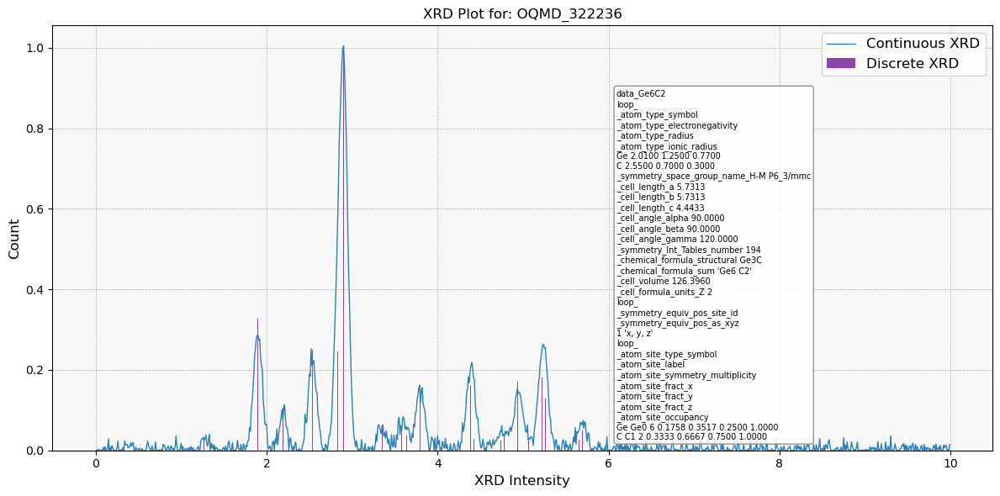

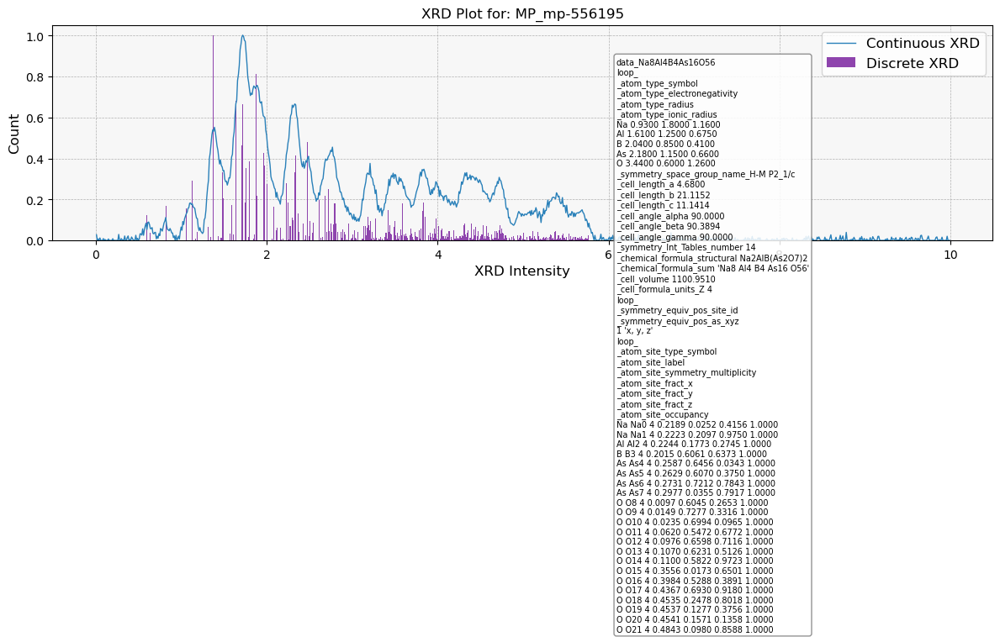

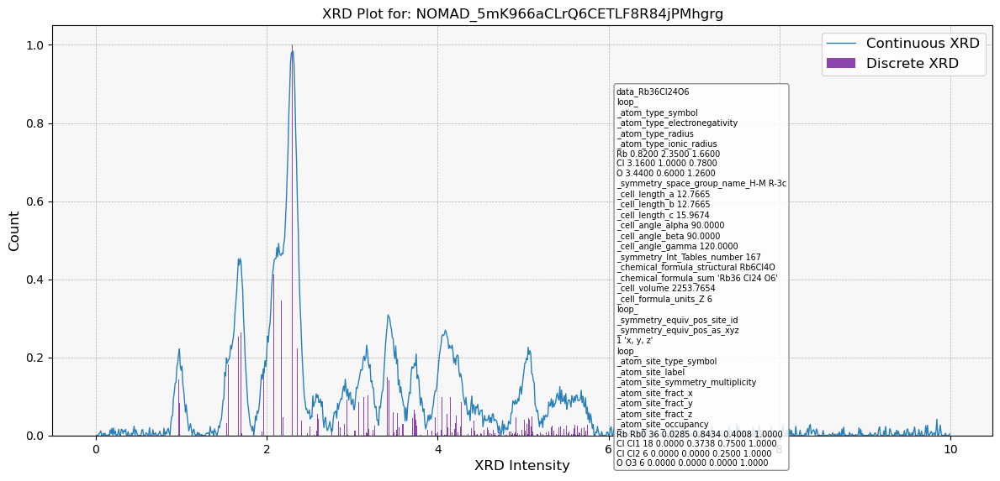

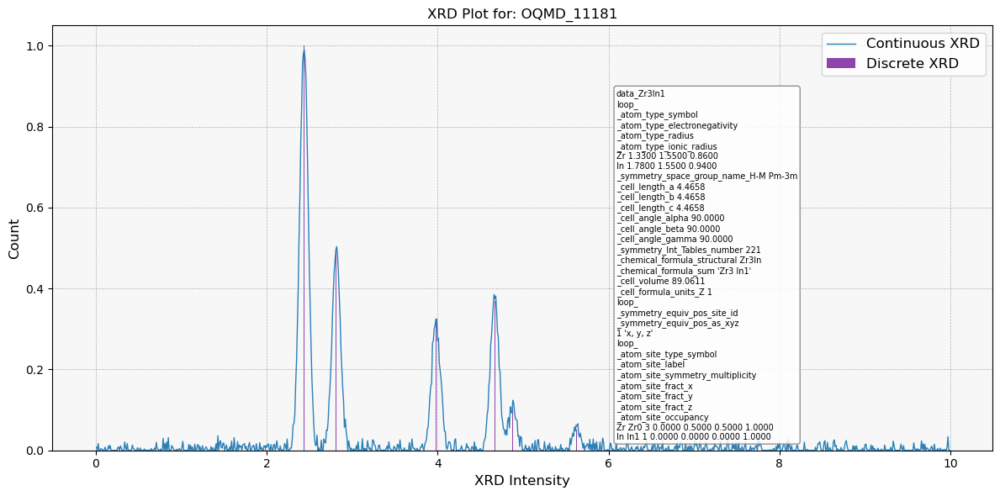

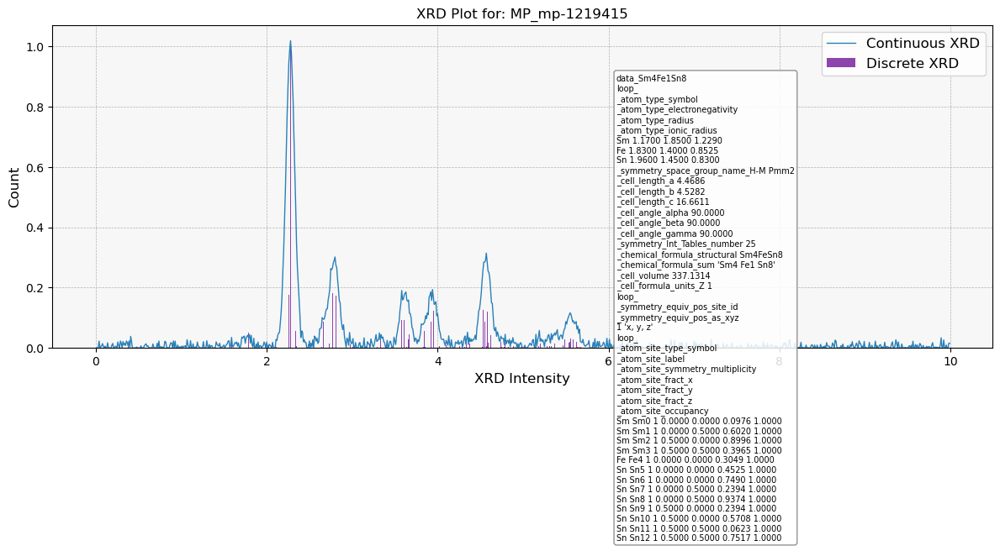

In [3]:
%matplotlib inline
for batch in dataloader:
    for i, (ni, x, y, xd, yd, xrd_tokens, cif_tokens, cif_content) in enumerate(zip(*batch)):
        
        # Debug max
        if i >= 5:
            break
        
        # Create a figure and axis with a clean style
        plt.figure(figsize=(12, 6))
        plt.title(f"XRD Plot for: {ni}", fontsize=12)

        # Style the plot with fancier colors and design
        plt.bar(xd, yd, width=0.01, color='#8e44ad', alpha=1, label='Discrete XRD', zorder=2)
        plt.plot(x[x != 0], y[x != 0], color='#2980b9', linewidth=1, alpha=1, label='Continuous XRD', zorder=3)

        # Add grid for better visibility
        plt.grid(True, which='both', axis='both', linestyle='--', linewidth=0.5, zorder=1)

        # Set labels for the axes
        plt.xlabel("XRD Intensity", fontsize=12)
        plt.ylabel("Count", fontsize=12)

        # Add a legend
        plt.legend(loc="upper right", fontsize=12)

        # Decode the tokens and plot them as text boxes
        xrd_tokens = xrd_tokens[xrd_tokens != tok.padding_id]
        decoded_xrd_tokens = tok.decode(list(xrd_tokens.numpy()))
        cif_tokens = cif_tokens[cif_tokens != tok.padding_id]
        decoded_cif_tokens = tok.decode(list(cif_tokens.numpy()))

        # Add the decoded tokens as textboxes
        text_box_props = dict(boxstyle="round,pad=0.3", edgecolor="gray", facecolor="white", alpha=0.85)
        plt.text(0.6, 0.85, decoded_cif_tokens,
                 transform=plt.gca().transAxes, fontsize=7, verticalalignment='top', bbox=text_box_props)

        # Enhance plot appearance with background color and styles
        plt.gca().set_facecolor("#f7f7f7")  # Light gray background

        plt.tight_layout()  # Ensure everything fits nicely
        plt.show()

    break


In [6]:
%matplotlib inline
for batch in dataloader:
    for i, (ni, x, y, xd, yd, xrd_tokens, cif_tokens, cif_content) in enumerate(zip(*batch)):
        print(cif_content)
                
        decoded_cif_tokens = tok.decode(list(cif_tokens.numpy()))
        print(decoded_cif_tokens.split("<pad>")[0])
        print("-"*10)


data_Ti2
_symmetry_space_group_name_H-M   Im-3m
_cell_length_a   3.2820
_cell_length_b   3.2820
_cell_length_c   3.2820
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   229
_chemical_formula_structural   Ti
_chemical_formula_sum   Ti2
_cell_volume   35.3521
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-y, x, z'
4  'y, -x, -z'
5  '-x, -y, z'
6  'x, y, -z'
7  'y, -x, z'
8  '-y, x, -z'
9  'x, -y, -z'
10  '-x, y, z'
11  '-y, -x, -z'
12  'y, x, z'
13  '-x, y, -z'
14  'x, -y, z'
15  'y, x, -z'
16  '-y, -x, z'
17  'z, x, y'
18  '-z, -x, -y'
19  'z, -y, x'
20  '-z, y, -x'
21  'z, -x, -y'
22  '-z, x, y'
23  'z, y, -x'
24  '-z, -y, x'
25  '-z, x, -y'
26  'z, -x, y'
27  '-z, -y, -x'
28  'z, y, x'
29  '-z, -x, y'
30  'z, x, -y'
31  '-z, y, x'
32  'z, -y, -x'
33  'y, z, x'
34  '-y, -z, -x'
35  'x, z, -y'
36  '-x, -z, y'
37  '-y, z, -x'
38  'y, -z, x'
39  '-x, z,

data_U4V4Cu4O40
_symmetry_space_group_name_H-M   P2_1/c
_cell_length_a   10.0850
_cell_length_b   8.0930
_cell_length_c   10.5990
_cell_angle_alpha   90.0000
_cell_angle_beta   103.4200
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   14
_chemical_formula_structural   UVCuO10
_chemical_formula_sum   'U4 V4 Cu4 O40'
_cell_volume   841.4474
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y+1/2, -z+1/2'
4  'x, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
U  U0  4  0.0009  0.5182  0.3167  1
V  V1  4  0.0895  0.1416  0.5575  1
Cu  Cu2  4  0.4502  0.5924  0.0968  1
O  O3  4  0.0040  0.5600  0.1047  1
O  O4  4  0.0412  0.1521  0.0005  1
O  O5  4  0.0772  0.2108  0.7244  1
O  O6  4  0.1670  0.5543  0.7276  1
O  O7  4  0.1701  0.5922  0.3645  1
O  O8  4  0.2457  0.1113  0.5620  1
O  O9 

data_Lu4N4
_symmetry_space_group_name_H-M   Fm-3m
_cell_length_a   4.7660
_cell_length_b   4.7660
_cell_length_c   4.7660
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   225
_chemical_formula_structural   LuN
_chemical_formula_sum   'Lu4 N4'
_cell_volume   108.2585
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-y, x, z'
4  'y, -x, -z'
5  '-x, -y, z'
6  'x, y, -z'
7  'y, -x, z'
8  '-y, x, -z'
9  'x, -y, -z'
10  '-x, y, z'
11  '-y, -x, -z'
12  'y, x, z'
13  '-x, y, -z'
14  'x, -y, z'
15  'y, x, -z'
16  '-y, -x, z'
17  'z, x, y'
18  '-z, -x, -y'
19  'z, -y, x'
20  '-z, y, -x'
21  'z, -x, -y'
22  '-z, x, y'
23  'z, y, -x'
24  '-z, -y, x'
25  '-z, x, -y'
26  'z, -x, y'
27  '-z, -y, -x'
28  'z, y, x'
29  '-z, -x, y'
30  'z, x, -y'
31  '-z, y, x'
32  'z, -y, -x'
33  'y, z, x'
34  '-y, -z, -x'
35  'x, z, -y'
36  '-x, -z, y'
37  '-y, z, -x'
38  'y, -z, x'
39

data_Mo8C4
_symmetry_space_group_name_H-M   Pbcn
_cell_length_a   4.7350
_cell_length_b   6.0250
_cell_length_c   5.2100
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   60
_chemical_formula_structural   Mo2C
_chemical_formula_sum   'Mo8 C4'
_cell_volume   148.6328
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x+1/2, -y+1/2, z+1/2'
4  'x+1/2, y+1/2, -z+1/2'
5  'x+1/2, -y+1/2, -z'
6  '-x+1/2, y+1/2, z'
7  '-x, y, -z+1/2'
8  'x, -y, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Mo  Mo0  8  0.2450  0.1250  0.0830  1.0000
C  C1  4  0.0000  0.3750  0.2500  1.0000
data_Mo8C4
_symmetry_space_group_name_H-M Pbcn
_cell_length_a 4.7350
_cell_length_b 6.0250
_cell_length_c 5.2100
_cell_angle_alpha 90.0000
_cell_angle_beta 90.0000
_cell_angle_ga

data_Lu4Cr4O16
_symmetry_space_group_name_H-M   I4_1/amd
_cell_length_a   7.0270
_cell_length_b   7.0270
_cell_length_c   6.2000
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   141
_chemical_formula_structural   LuCrO4
_chemical_formula_sum   'Lu4 Cr4 O16'
_cell_volume   306.1481
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-y, x+1/2, z+1/4'
3  '-x+1/2, -y+1/2, z+1/2'
4  'y+1/2, -x, z+3/4'
5  'x, -y+1/2, -z+1/4'
6  '-y, -x, -z'
7  '-x+1/2, y, -z+3/4'
8  'y+1/2, x+1/2, -z+1/2'
9  '-x, -y+1/2, -z+1/4'
10  'y, -x, -z'
11  'x+1/2, y, -z+3/4'
12  '-y+1/2, x+1/2, -z+1/2'
13  '-x, y, z'
14  'y, x+1/2, z+1/4'
15  'x+1/2, -y+1/2, z+1/2'
16  '-y+1/2, -x, z+3/4'
17  'x+1/2, y+1/2, z+1/2'
18  '-y+1/2, x, z+3/4'
19  '-x, -y, z'
20  'y, -x+1/2, z+1/4'
21  'x+1/2, -y, -z+3/4'
22  '-y+1/2, -x+1/2, -z+1/2'
23  '-x, y+1/2, -z+1/4'
24  'y, x, -z'
25  '-x+1/2, -y, -z+3/4'
26  'y+1/2,

data_Fe1H44C12N10O16
_symmetry_space_group_name_H-M   P-1
_cell_length_a   9.1040
_cell_length_b   9.3490
_cell_length_c   9.7000
_cell_angle_alpha   87.7430
_cell_angle_beta   75.6740
_cell_angle_gamma   61.2480
_symmetry_Int_Tables_number   2
_chemical_formula_structural   FeH44C12(N5O8)2
_chemical_formula_sum   'Fe1 H44 C12 N10 O16'
_cell_volume   698.2138
_cell_formula_units_Z   1
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Fe  Fe0  1  0.0000  0.0000  0.0000  1.0000
H  H1  2  0.0240  0.1570  0.2110  1.0000
H  H2  2  0.0530  0.8380  0.2254  1.0000
H  H3  2  0.0730  0.7116  0.8690  1.0000
H  H4  2  0.0970  0.3740  0.8510  1.0000
H  H5  2  0.1430  0.5030  0.3160  1.0000
H  H6  2  0.1670  0.3660  0.9990  1.0000
H  H7  2  0.1690  0.3380  0.3100  1.0000
H  H8  2  0.2050  0.4790  0.6350  1

data_Cd2H28C40N4O10
_symmetry_space_group_name_H-M   P-1
_cell_length_a   9.1831
_cell_length_b   9.6550
_cell_length_c   11.3600
_cell_angle_alpha   104.6310
_cell_angle_beta   104.0390
_cell_angle_gamma   101.8920
_symmetry_Int_Tables_number   2
_chemical_formula_structural   CdH14C20N2O5
_chemical_formula_sum   'Cd2 H28 C40 N4 O10'
_cell_volume   906.2836
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Cd  Cd0  2  0.0421  0.8159  0.6470  1.0000
H  H1  2  0.0400  0.6730  0.4040  1.0000
H  H2  2  0.0420  0.3738  0.8153  1.0000
H  H3  2  0.0420  0.8000  0.4040  1.0000
H  H4  2  0.0609  0.2775  0.9830  1.0000
H  H5  2  0.1718  0.1835  0.7869  1.0000
H  H6  2  0.1842  0.5247  0.5621  1.0000
H  H7  2  0.2174  0.1088  0.1161  1.0000
H  H8  2  0.2250  0.8753  0.0258  1.

data_Bi2I2O2
_symmetry_space_group_name_H-M   P4/nmm
_cell_length_a   3.9940
_cell_length_b   3.9940
_cell_length_c   9.1549
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   129
_chemical_formula_structural   BiIO
_chemical_formula_sum   'Bi2 I2 O2'
_cell_volume   146.0379
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-y+1/2, x+1/2, z'
3  '-x, -y, z'
4  'y+1/2, -x+1/2, z'
5  'x+1/2, -y+1/2, -z'
6  '-y, -x, -z'
7  '-x+1/2, y+1/2, -z'
8  'y, x, -z'
9  '-x+1/2, -y+1/2, -z'
10  'y, -x, -z'
11  'x+1/2, y+1/2, -z'
12  '-y, x, -z'
13  '-x, y, z'
14  'y+1/2, x+1/2, z'
15  'x, -y, z'
16  '-y+1/2, -x+1/2, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Bi  Bi0  2  0.0000  0.5000  0.8664  1.0000
I  I1  2  0.0000  0.5000  0.3341  1.0000
O  O2  2  0.0000  0.0000  0.000

data_Rb8S8N4O24
_symmetry_space_group_name_H-M   C2/c
_cell_length_a   12.8000
_cell_length_b   7.6800
_cell_length_c   7.4500
_cell_angle_alpha   90.0000
_cell_angle_beta   91.9000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   15
_chemical_formula_structural   Rb2S2NO6
_chemical_formula_sum   'Rb8 S8 N4 O24'
_cell_volume   731.9622
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y, -z+1/2'
4  'x, -y, z+1/2'
5  'x+1/2, y+1/2, z'
6  '-x+1/2, -y+1/2, -z'
7  '-x+1/2, y+1/2, -z+1/2'
8  'x+1/2, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Rb  Rb0  8  0.1540  0.1370  0.8650  1.0000
S  S1  8  0.0940  0.3190  0.3590  1.0000
N  N2  4  0.0000  0.4300  0.2500  1.0000
O  O3  8  0.0600  0.2500  0.5600  1.0000
O  O4  8  0.1600  0.2200  0.2500  1.0000
O  O5  8  0.1900  0.4800  0.4700  1.00

data_Mg1Fe6Ge6
_symmetry_space_group_name_H-M   P6/mmm
_cell_length_a   5.0670
_cell_length_b   5.0670
_cell_length_c   8.0450
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   120.0000
_symmetry_Int_Tables_number   191
_chemical_formula_structural   Mg(FeGe)6
_chemical_formula_sum   'Mg1 Fe6 Ge6'
_cell_volume   178.8786
_cell_formula_units_Z   1
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  'x-y, x, z'
4  '-x+y, -x, -z'
5  '-y, x-y, z'
6  'y, -x+y, -z'
7  '-x, -y, z'
8  'x, y, -z'
9  '-x+y, -x, z'
10  'x-y, x, -z'
11  'y, -x+y, z'
12  '-y, x-y, -z'
13  '-y, -x, -z'
14  'y, x, z'
15  '-x, -x+y, -z'
16  'x, x-y, z'
17  '-x+y, y, -z'
18  'x-y, -y, z'
19  'y, x, -z'
20  '-y, -x, z'
21  'x, x-y, -z'
22  '-x, -x+y, z'
23  'x-y, -y, -z'
24  '-x+y, y, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Mg  Mg0  1  0

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



data_Tb2P2H32C26N2O26
_symmetry_space_group_name_H-M   P-1
_cell_length_a   7.8354
_cell_length_b   9.9100
_cell_length_c   12.8520
_cell_angle_alpha   67.7800
_cell_angle_beta   89.7210
_cell_angle_gamma   80.2360
_symmetry_Int_Tables_number   2
_chemical_formula_structural   TbPH16C13NO13
_chemical_formula_sum   'Tb2 P2 H32 C26 N2 O26'
_cell_volume   908.5290
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Tb  Tb0  2  0.2875  0.3211  0.4133  1.0000
P  P1  2  0.3191  0.5409  0.1153  1.0000
H  H2  2  0.0406  0.6699  0.0742  1.0000
H  H3  2  0.0661  0.2347  0.3060  1.0000
H  H4  2  0.0854  0.8243  0.8794  1.0000
H  H5  2  0.1007  0.8179  0.4639  1.0000
H  H6  2  0.1077  0.1045  0.3857  1.0000
H  H7  2  0.1274  0.6959  0.1729  1.0000
H  H8  2  0.1350  0.0491  0.7493 

data_Sb4Cl4F40
_symmetry_space_group_name_H-M   Pbcm
_cell_length_a   5.9570
_cell_length_b   15.1700
_cell_length_c   7.9640
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   57
_chemical_formula_structural   SbClF10
_chemical_formula_sum   'Sb4 Cl4 F40'
_cell_volume   719.6883
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, -y, z+1/2'
4  'x, y, -z+1/2'
5  'x, -y+1/2, -z'
6  '-x, y+1/2, z'
7  '-x, y+1/2, -z+1/2'
8  'x, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Sb  Sb0  4  0.0904  0.1402  0.2500  1.0000
Cl  Cl1  4  0.4117  0.6561  0.7500  1.0000
F  F2  8  0.0902  0.1429  0.0162  1.0000
F  F3  8  0.4100  0.6504  0.5472  1.0000
F  F4  4  0.1047  0.5445  0.2500  1.0000
F  F5  4  0.1565  0.7191  0.2500  1.0000
F  F6  4  0.195

data_Li4Co4P4O16
_symmetry_space_group_name_H-M   Pnma
_cell_length_a   10.1931
_cell_length_b   5.9195
_cell_length_c   4.6961
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   62
_chemical_formula_structural   LiCoPO4
_chemical_formula_sum   'Li4 Co4 P4 O16'
_cell_volume   283.3535
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x+1/2, -y, z+1/2'
4  'x+1/2, y, -z+1/2'
5  'x+1/2, -y+1/2, -z+1/2'
6  '-x+1/2, y+1/2, z+1/2'
7  '-x, y+1/2, -z'
8  'x, -y+1/2, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Li  Li0  4  0.0000  0.0000  0.0000  1.0000
Co  Co1  4  0.2214  0.2500  0.5224  1.0000
P  P2  4  0.0956  0.7500  0.5833  1.0000
O  O3  8  0.1635  0.5485  0.7160  1.0000
O  O4  4  0.0444  0.2500  0.2940  1.0000
O  O5  4  0.0952  0.7500  0.2700  1

data_Zr2O4
_symmetry_space_group_name_H-M   P4_2/nmc
_cell_length_a   3.5781
_cell_length_b   3.5781
_cell_length_c   5.1623
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   137
_chemical_formula_structural   ZrO2
_chemical_formula_sum   'Zr2 O4'
_cell_volume   66.0919
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-y+1/2, x+1/2, z+1/2'
3  '-x, -y, z'
4  'y+1/2, -x+1/2, z+1/2'
5  'x+1/2, -y+1/2, -z+1/2'
6  '-y, -x, -z'
7  '-x+1/2, y+1/2, -z+1/2'
8  'y, x, -z'
9  '-x+1/2, -y+1/2, -z+1/2'
10  'y, -x, -z'
11  'x+1/2, y+1/2, -z+1/2'
12  '-y, x, -z'
13  '-x, y, z'
14  'y+1/2, x+1/2, z+1/2'
15  'x, -y, z'
16  '-y+1/2, -x+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Zr  Zr0  2  0.0000  0.0000  0.0000  1.0000
O  O1  4  0.0000  0.5000  0.0484  1.0000
dat

data_Ba4Y8Zn4O20
_symmetry_space_group_name_H-M   Pnma
_cell_length_a   12.3240
_cell_length_b   5.7060
_cell_length_c   7.0680
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   62
_chemical_formula_structural   BaY2ZnO5
_chemical_formula_sum   'Ba4 Y8 Zn4 O20'
_cell_volume   497.0270
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x+1/2, -y, z+1/2'
4  'x+1/2, y, -z+1/2'
5  'x+1/2, -y+1/2, -z+1/2'
6  '-x+1/2, y+1/2, z+1/2'
7  '-x, y+1/2, -z'
8  'x, -y+1/2, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Ba  Ba0  4  0.0996  0.7500  0.0767  1.0000
Y  Y1  4  0.0734  0.2500  0.3956  1.0000
Y  Y2  4  0.2063  0.7500  0.6220  1.0000
Zn  Zn3  4  0.1505  0.2500  0.8058  1.0000
O  O4  8  0.0630  0.0130  0.6670  1.0000
O  O5  8  0.2430  0.0200  0.3550  

data_Ag16S8O32
_symmetry_space_group_name_H-M   Fddd
_cell_length_a   5.7960
_cell_length_b   10.2238
_cell_length_c   12.6670
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   70
_chemical_formula_structural   Ag2SO4
_chemical_formula_sum   'Ag16 S8 O32'
_cell_volume   750.6103
_cell_formula_units_Z   8
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, z'
3  'x, -y, -z'
4  '-x, y, -z'
5  '-x+1/4, -y+1/4, -z+1/4'
6  'x+1/4, y+1/4, -z+1/4'
7  '-x+1/4, y+1/4, z+1/4'
8  'x+1/4, -y+1/4, z+1/4'
9  'x+1/2, y, z+1/2'
10  '-x+1/2, -y, z+1/2'
11  'x+1/2, -y, -z+1/2'
12  '-x+1/2, y, -z+1/2'
13  '-x+3/4, -y+1/4, -z+3/4'
14  'x+3/4, y+1/4, -z+3/4'
15  '-x+3/4, y+1/4, z+3/4'
16  'x+3/4, -y+1/4, z+3/4'
17  'x+1/2, y+1/2, z'
18  '-x+1/2, -y+1/2, z'
19  'x+1/2, -y+1/2, -z'
20  '-x+1/2, y+1/2, -z'
21  '-x+3/4, -y+3/4, -z+1/4'
22  'x+3/4, y+3/4, -z+1/4'
23  '-x+3/4, y+3/4, z+1/4'
24  'x+3/4, -y+3/4, z+1/4'

data_Cu4H44C20N4O24
_symmetry_space_group_name_H-M   C2/c
_cell_length_a   13.4008
_cell_length_b   8.4704
_cell_length_c   8.3956
_cell_angle_alpha   90.0000
_cell_angle_beta   123.8477
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   15
_chemical_formula_structural   CuH11C5NO6
_chemical_formula_sum   'Cu4 H44 C20 N4 O24'
_cell_volume   791.4716
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y, -z+1/2'
4  'x, -y, z+1/2'
5  'x+1/2, y+1/2, z'
6  '-x+1/2, -y+1/2, -z'
7  '-x+1/2, y+1/2, -z+1/2'
8  'x+1/2, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Cu  Cu0  4  0.2500  0.2500  0.5000  1.0000
H  H1  8  0.0057  0.6501  0.4279  1.0000
H  H2  8  0.0670  0.1380  0.7770  1.0000
H  H3  8  0.1019  0.2160  0.0321  1.0000
H  H4  8  0.1208  0.3499  0.9226  1.0000
H  H5  8  0.2241  0.4778  

data_Mn4B4H24C32O12
_symmetry_space_group_name_H-M   P2_1/c
_cell_length_a   6.6618
_cell_length_b   11.1029
_cell_length_c   12.2334
_cell_angle_alpha   90.0000
_cell_angle_beta   102.1000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   14
_chemical_formula_structural   MnBH6C8O3
_chemical_formula_sum   'Mn4 B4 H24 C32 O12'
_cell_volume   884.7443
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y+1/2, -z+1/2'
4  'x, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Mn  Mn0  4  0.2625  0.2146  0.9304  1.0000
B  B1  4  0.0925  0.0486  0.5412  1.0000
H  H2  4  0.0780  0.0690  0.6270  1.0000
H  H3  4  0.0840  0.5650  0.0270  1.0000
H  H4  4  0.2334  0.0617  0.3223  1.0000
H  H5  4  0.3142  0.7331  0.4852  1.0000
H  H6  4  0.4499  0.6841  0.1814  1.0000
H  H7  4  0.4543  0.1922  0.6391

data_Sb4H20C8N8F24
_symmetry_space_group_name_H-M   P2_1/c
_cell_length_a   7.7291
_cell_length_b   9.3482
_cell_length_c   10.1754
_cell_angle_alpha   90.0000
_cell_angle_beta   97.4810
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   14
_chemical_formula_structural   SbH5C2(NF3)2
_chemical_formula_sum   'Sb4 H20 C8 N8 F24'
_cell_volume   728.9469
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y+1/2, -z+1/2'
4  'x, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Sb  Sb0  4  0.2227  0.6767  0.4428  1.0000
H  H1  4  0.1269  0.2125  0.8026  1.0000
H  H2  4  0.2350  0.0790  0.2280  1.0000
H  H3  4  0.3090  0.0890  0.3700  1.0000
H  H4  4  0.3186  0.1722  0.8724  1.0000
H  H5  4  0.4080  0.1120  0.2720  1.0000
C  C6  4  0.2529  0.2206  0.7950  1.0000
C  C7  4  0.2897  0.1510  0.6733 

data_Si2O4
_symmetry_space_group_name_H-M   P4_2/mnm
_cell_length_a   4.1564
_cell_length_b   4.1564
_cell_length_c   2.6602
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   136
_chemical_formula_structural   SiO2
_chemical_formula_sum   'Si2 O4'
_cell_volume   45.9567
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-y+1/2, x+1/2, z+1/2'
4  'y+1/2, -x+1/2, -z+1/2'
5  '-x, -y, z'
6  'x, y, -z'
7  'y+1/2, -x+1/2, z+1/2'
8  '-y+1/2, x+1/2, -z+1/2'
9  'x+1/2, -y+1/2, -z+1/2'
10  '-x+1/2, y+1/2, z+1/2'
11  '-y, -x, -z'
12  'y, x, z'
13  '-x+1/2, y+1/2, -z+1/2'
14  'x+1/2, -y+1/2, z+1/2'
15  'y, x, -z'
16  '-y, -x, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Si  Si0  2  0.0000  0.0000  0.0000  1.0000
O  O1  4  0.1921  0.8079  0.5000  1.0000
dat

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



data_Cu4P4H28C24O16
_symmetry_space_group_name_H-M   P2_1/c
_cell_length_a   13.9871
_cell_length_b   7.6637
_cell_length_c   7.4534
_cell_angle_alpha   90.0000
_cell_angle_beta   91.7500
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   14
_chemical_formula_structural   CuPH7(C3O2)2
_chemical_formula_sum   'Cu4 P4 H28 C24 O16'
_cell_volume   798.5792
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y+1/2, -z+1/2'
4  'x, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Cu  Cu0  4  0.0228  0.6913  0.4440  1.0000
P  P1  4  0.1116  0.0451  0.3518  1.0000
H  H2  4  0.1289  0.0321  0.8793  1.0000
H  H3  4  0.1302  0.5984  0.2246  1.0000
H  H4  4  0.2386  0.2309  0.1251  1.0000
H  H5  4  0.2714  0.6592  0.9803  1.0000
H  H6  4  0.3993  0.2151  0.0627  1.0000
H  H7  4  0.4327  0.6703  0.922

data_H16Pt2C20Br4N4Cl4
_symmetry_space_group_name_H-M   P2_1/c
_cell_length_a   6.1988
_cell_length_b   14.1390
_cell_length_c   7.7700
_cell_angle_alpha   90.0000
_cell_angle_beta   96.8260
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   14
_chemical_formula_structural   H8PtC10Br2(NCl)2
_chemical_formula_sum   'H16 Pt2 C20 Br4 N4 Cl4'
_cell_volume   676.1732
_cell_formula_units_Z   2
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y+1/2, -z+1/2'
4  'x, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
H  H0  4  0.0532  0.5446  0.8545  1.0000
H  H1  4  0.1805  0.1755  0.6926  1.0000
H  H2  4  0.3170  0.6579  0.5194  1.0000
H  H3  4  0.4713  0.2078  0.4350  1.0000
Pt  Pt4  2  0.5000  0.0000  0.5000  1.0000
C  C5  4  0.0354  0.1833  0.6396  1.0000
C  C6  4  0.0440  0.7290  0.4115  1.0000
C  C7  4  0.1051  0.

data_Co1H28C26N8O12
_symmetry_space_group_name_H-M   P-1
_cell_length_a   8.0720
_cell_length_b   9.7600
_cell_length_c   11.2600
_cell_angle_alpha   107.2350
_cell_angle_beta   104.6000
_cell_angle_gamma   101.2930
_symmetry_Int_Tables_number   2
_chemical_formula_structural   CoH28C26(N2O3)4
_chemical_formula_sum   'Co1 H28 C26 N8 O12'
_cell_volume   783.9986
_cell_formula_units_Z   1
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Co  Co0  1  0.0000  0.0000  0.0000  1.0000
H  H1  2  0.0051  0.5511  0.6278  1.0000
H  H2  2  0.1020  0.7896  0.7888  1.0000
H  H3  2  0.1055  0.8363  0.4002  1.0000
H  H4  2  0.1316  0.3096  0.5446  1.0000
H  H5  2  0.1394  0.5668  0.0024  1.0000
H  H6  2  0.1713  0.9228  0.2425  1.0000
H  H7  2  0.1715  0.1607  0.4816  1.0000
H  H8  2  0.2528  0.4804  0.9345 

data_U4B4N4
_symmetry_space_group_name_H-M   Cmcm
_cell_length_a   3.5851
_cell_length_b   11.8273
_cell_length_c   3.3254
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   63
_chemical_formula_structural   UBN
_chemical_formula_sum   'U4 B4 N4'
_cell_volume   141.0038
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, -y, z+1/2'
4  'x, y, -z+1/2'
5  'x, -y, -z'
6  '-x, y, z'
7  '-x, y, -z+1/2'
8  'x, -y, z+1/2'
9  'x+1/2, y+1/2, z'
10  '-x+1/2, -y+1/2, -z'
11  '-x+1/2, -y+1/2, z+1/2'
12  'x+1/2, y+1/2, -z+1/2'
13  'x+1/2, -y+1/2, -z'
14  '-x+1/2, y+1/2, z'
15  '-x+1/2, y+1/2, -z+1/2'
16  'x+1/2, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
U  U0  4  0.0000  0.1386  0.2500  1.0000
B  B1  4  0.0000  0.4624  0.2500  1.0000
N  N2 

data_Cu16P8O32F8
_symmetry_space_group_name_H-M   C2/c
_cell_length_a   12.7370
_cell_length_b   6.1820
_cell_length_c   9.9620
_cell_angle_alpha   90.0000
_cell_angle_beta   119.1500
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   15
_chemical_formula_structural   Cu2PO4F
_chemical_formula_sum   'Cu16 P8 O32 F8'
_cell_volume   685.0618
_cell_formula_units_Z   8
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, -z'
3  '-x, y, -z+1/2'
4  'x, -y, z+1/2'
5  'x+1/2, y+1/2, z'
6  '-x+1/2, -y+1/2, -z'
7  '-x+1/2, y+1/2, -z+1/2'
8  'x+1/2, -y+1/2, z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Cu  Cu0  8  0.0616  0.2621  0.0031  1.0000
Cu  Cu1  8  0.1535  0.1159  0.3519  1.0000
P  P2  8  0.1723  0.3927  0.8024  1.0000
O  O3  8  0.0775  0.4316  0.6361  1.0000
O  O4  8  0.1362  0.1961  0.8671  1.0000
O  O5  8  0.1844  0.4155  0.4052  

data_Ca18Si6O30
_symmetry_space_group_name_H-M   Cm
_cell_length_a   12.2350
_cell_length_b   7.0730
_cell_length_c   9.2980
_cell_angle_alpha   90.0000
_cell_angle_beta   116.3100
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   8
_chemical_formula_structural   Ca3SiO5
_chemical_formula_sum   'Ca18 Si6 O30'
_cell_volume   721.2792
_cell_formula_units_Z   6
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  'x, -y, z'
3  'x+1/2, y+1/2, z'
4  'x+1/2, -y+1/2, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Ca  Ca0  4  0.0199  0.2664  0.3207  1.0000
Ca  Ca1  4  0.2491  0.2522  0.9984  1.0000
Ca  Ca2  4  0.4799  0.2335  0.6687  1.0000
Ca  Ca3  2  0.0002  0.5000  0.9995  1.0000
Ca  Ca4  2  0.2111  0.5000  0.6667  1.0000
Ca  Ca5  2  0.2836  0.0000  0.3168  1.0000
Si  Si6  2  0.0028  0.0000  0.0007  1.0000
Si  Si7  2  0.2174  0.0000  0.6523  1.0000

data_Yb4H36C16N8O32
_symmetry_space_group_name_H-M   Pca2_1
_cell_length_a   18.1272
_cell_length_b   6.5391
_cell_length_c   7.5198
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   29
_chemical_formula_structural   YbH9C4(NO4)2
_chemical_formula_sum   'Yb4 H36 C16 N8 O32'
_cell_volume   891.3638
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x, -y, z+1/2'
3  '-x+1/2, y, z+1/2'
4  'x+1/2, -y, z'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Yb  Yb0  4  0.1021  0.7921  0.7660  1.0000
H  H1  4  0.0309  0.4243  0.5211  1.0000
H  H2  4  0.0529  0.9208  0.2375  1.0000
H  H3  4  0.1200  0.2840  0.2660  1.0000
H  H4  4  0.1339  0.2758  0.9083  1.0000
H  H5  4  0.1532  0.5731  0.1928  1.0000
H  H6  4  0.1620  0.2920  0.4361  1.0000
H  H7  4  0.1720  0.6004  0.3836 

data_Fe4H36C40N12
_symmetry_space_group_name_H-M   P2_12_12_1
_cell_length_a   7.4498
_cell_length_b   10.6899
_cell_length_c   11.6023
_cell_angle_alpha   90.0000
_cell_angle_beta   90.0000
_cell_angle_gamma   90.0000
_symmetry_Int_Tables_number   19
_chemical_formula_structural   FeH9C10N3
_chemical_formula_sum   'Fe4 H36 C40 N12'
_cell_volume   923.9795
_cell_formula_units_Z   4
loop_
_symmetry_equiv_pos_site_id
_symmetry_equiv_pos_as_xyz
1  'x, y, z'
2  '-x+1/2, -y, z+1/2'
3  'x+1/2, -y+1/2, -z'
4  '-x, y+1/2, -z+1/2'
loop_
_atom_site_type_symbol
_atom_site_label
_atom_site_symmetry_multiplicity
_atom_site_fract_x
_atom_site_fract_y
_atom_site_fract_z
_atom_site_occupancy
Fe  Fe0  4  0.0484  0.9614  0.0988  1.0000
H  H1  4  0.0435  0.7139  0.0400  1.0000
H  H2  4  0.0576  0.8742  0.8787  1.0000
H  H3  4  0.0659  0.4467  0.1790  1.0000
H  H4  4  0.0875  0.1476  0.2572  1.0000
H  H5  4  0.0935  0.0142  0.6332  1.0000
H  H6  4  0.2174  0.9580  0.4359  1.0000
H  H7  4  0.2184  0.6212  

KeyboardInterrupt: 

In [30]:
import sys

In [33]:
n = 0
for batch in dataloader:
    for i, (ni, x, y, xd, yd, xrd_tokens, cif_tokens, cif_content) in enumerate(zip(*batch)):
#         print(cif_content)
                
        decoded_cif_tokens = tok.decode(list(cif_tokens.numpy())).split('<pad>')[0]
        if len(decoded_cif_tokens) < 1:
            n += 1
            #print(tok.decode(list(cif_tokens.numpy())))
            #sys.exit(1)
        #print(decoded_cif_tokens.split("<pad>")[0])
        #print("-"*10)


In [37]:
n / (len(dataloader)*32)

0.14439655172413793

In [38]:
len(dataloader)*32

928

In [39]:
len(dataset)

902

In [42]:
928 - 0.14439655172413793*928

794.0